In [2]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import e3nn
from e3nn import o3, io
import numpy as np
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import open3d as o3d
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from tqdm.notebook import tqdm
from functools import partial, reduce

from utils import load_model, save_model, CustomLRScheduler

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'cpu' # for now batch=1 so no need for gpu
device


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


'cpu'

In [3]:
from data_generation import SimpleShapeDataset, SimpleShapeUniformRayDataset

dataset = SimpleShapeUniformRayDataset(sample_points=20000)

data = next(iter(DataLoader(dataset, batch_size=1))).float()

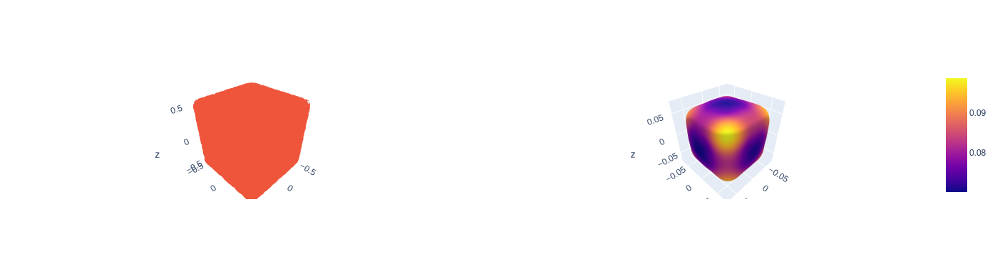

In [4]:
# how does it look like in spherical harmonics?

sphten = io.SphericalTensor(11, 1, 1)
signal = o3.spherical_harmonics(sphten, x=data, normalize=False).mean(dim=[0, 1])

fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
# fig.add_trace(go.Scatter3d(x=0.12 * data[0, :, 0], y=0.12 * data[0, :, 1], z=0.12 * data[0, :, 2]), row=1, col=2)
fig.add_trace(go.Surface(sphten.plotly_surface(signal, radius=True)[0]), row=1, col=2)
fig.add_trace(go.Scatter3d(x=data[0, :, 0], y=data[0, :, 1], z=data[0, :, 2]), row=1, col=1)

In [6]:
class SelfTP(nn.Module):
    def __init__(self, irreps_in, irreps_out, batch_norm=True):
        super(SelfTP, self).__init__()
        
        self.tp = o3.FullyConnectedTensorProduct(irreps_in1=irreps_in, irreps_in2=irreps_in, irreps_out=irreps_out)
        self.bn = e3nn.nn.BatchNorm(irreps_out)
        self.batch_norm = batch_norm
        
    def forward(self, x):
        x = self.tp(x, x)
        if self.batch_norm:
            x = self.bn(x)
        return x      


class EncoderDecoder(nn.Module):
    def __init__(self, lmax=8, max_channel=64):
        super(EncoderDecoder, self).__init__()
       
        self.model_sphten_repr = io.SphericalTensor(lmax=lmax, p_arg=1, p_val=1)
        self.irrep_layer = []
        tw = 1
        for l in range(lmax, 0, -1): # last one sould be lmax=1
            irreps = io.SphericalTensor(lmax=l, p_arg=1, p_val=1)
            irreps = irreps * tw
            irreps = (irreps.sort())[0]
            irreps = irreps.simplify()
            self.irrep_layer.append(irreps)
            tw *= 2
            tw = min(tw, max_channel) # todo tune the max channel later
        
        # todo should the last layer have batch norm?
        # todo use fully connected tensor product?
        self.encoder = nn.Sequential(*[
            SelfTP(irreps_in=self.irrep_layer[i], irreps_out=self.irrep_layer[i+1], batch_norm=(i != len(self.irrep_layer)-2))
            for i in range(len(self.irrep_layer)-1)
        ])

        # todo is the information bottleneck limited enough?
        self.decoder = nn.Sequential(*[
            SelfTP(irreps_in=self.irrep_layer[i+1], irreps_out=self.irrep_layer[i], batch_norm=(i != 0))
            for i in range(len(self.irrep_layer)-2, -1, -1)            
        ])

    # def forward(self, points):
    #     inp = o3.spherical_harmonics(l=self.model_sphten_repr, x=points, normalize=False).mean(dim=1) # todo fix the normalization later
    #     latent = self.encoder(inp)
    #     out = self.decoder(latent)
    #     return inp, latent, out

    def forward(self, inp):
        # inp = o3.spherical_harmonics(l=self.model_sphten_repr, x=points, normalize=False).mean(dim=1) # todo fix the normalization later
        latent = self.encoder(inp)
        out = self.decoder(latent)
        return inp, latent, out

In [7]:
model = EncoderDecoder().to(device)

print("number of parameters = ", sum([np.prod(x.shape) for x in model.parameters()]))

dataset = SimpleShapeUniformRayDataset(sample_points=20000)

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs

number of parameters =  9239206


In [8]:
shs = []

for i in range(len(dataset)):
    points = torch.from_numpy(dataset[i])
    sh = o3.spherical_harmonics(l=model.model_sphten_repr, x=points, normalize=False).mean(dim=0)
    shs.append(sh)

In [9]:
def train(
        model,
        dataset,
        loss_fn,        
        epochs=600,
        checkpoint_interval=50,
        initial_rl=1,
        scheduler=None,
        optimizer=None
):
    
    if optimizer is None:
        optimizer = torch.optim.Adam(model.parameters(), lr=initial_rl)

    dataloader = DataLoader(dataset, batch_size=len(dataset))

    pbar = tqdm(range(epochs))
    losses = []
    for epoch in pbar:
        for data in dataloader:
            data = data.float().to(device)            
            inp, latent, out = model(data)    
            loss = loss_fn(inp, out)
            optimizer.zero_grad()
            loss.backward()
            max_grad = max([torch.linalg.norm(p.grad).item() for p in model.parameters() if p.grad is not None])
            optimizer.step()
            pbar.set_description(f'Epoch {i+1} Loss: {loss.item():.8f} Lr={optimizer.param_groups[0]["lr"]} MaxGrad={max_grad:.4f}')
            losses.append(loss.item())
            
        if epoch % checkpoint_interval == 0:
            name = f'epoch_{epoch}'
            save_model(model, name)
            print(f'saved {name}')

        if scheduler is not None:   
            scheduler.step()
    return losses

In [10]:
save_model(model, 'initial_state')
# load_model(model, 'sample')

In [15]:
initial_rl = 1
optimizer = torch.optim.Adam(model.parameters(), lr=initial_rl)
custom_scheduler = CustomLRScheduler(optimizer, initial_rl)
# scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100, 200, 300, 400, 500], gamma=1.1) # todo interesting apparently you shouldn't change rl
loss_fn = torch.nn.MSELoss(reduction='sum')

  0%|          | 0/100 [00:00<?, ?it/s]

saved epoch_0
saved epoch_50


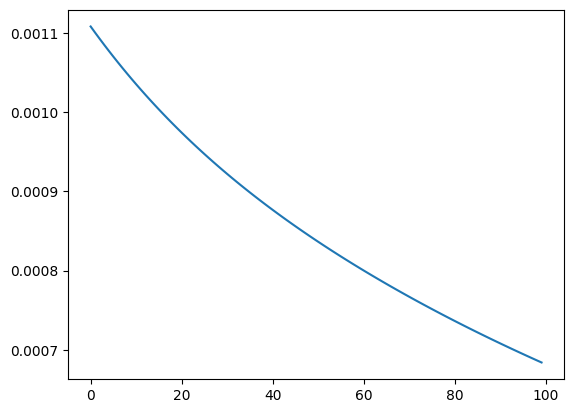

In [18]:
losses = train(model=model, dataset=shs, loss_fn=loss_fn, epochs=100, initial_rl=None, scheduler=custom_scheduler, optimizer=optimizer)
save_model(model, 'final_state')

plt.plot(losses)

  0%|          | 0/100 [00:00<?, ?it/s]

saved epoch_0
saved epoch_50


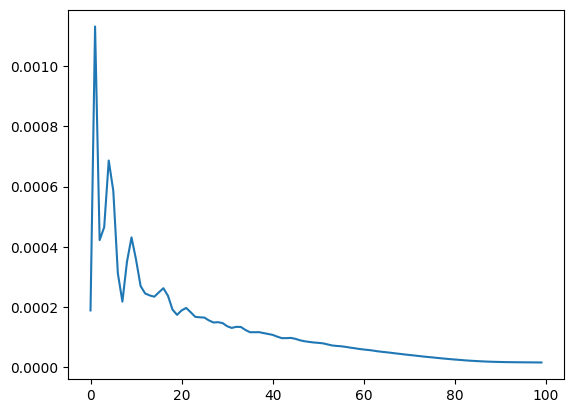

In [49]:
load_model(model, 'initial_state')

initial_rl = 0.01
optimizer = torch.optim.Adam(model.parameters(), lr=initial_rl)
custom_scheduler = CustomLRScheduler(optimizer, initial_rl)

losses = train(model=model, dataset=shs, loss_fn=loss_fn, epochs=100, initial_rl=None, scheduler=custom_scheduler, optimizer=optimizer)
save_model(model, 'final_state')

plt.plot(losses)

In [54]:
load_model(model, 'final_state')
save_model(model, 'almost_perfect_state')

  0%|          | 0/100 [00:00<?, ?it/s]

saved epoch_0
saved epoch_50


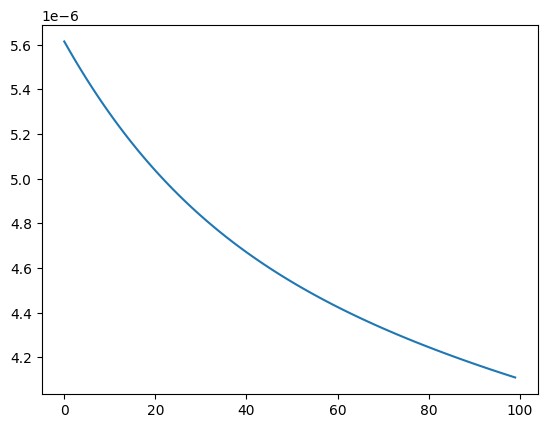

In [60]:
# optimizer = torch.optim.Adam(model.parameters(), lr=initial_rl)
# custom_scheduler = CustomLRScheduler(optimizer, initial_rl)

custom_scheduler.set_rl(0.01)
losses = train(model=model, dataset=shs, loss_fn=loss_fn, epochs=100, initial_rl=None, scheduler=custom_scheduler, optimizer=optimizer)
save_model(model, 'final_state')

plt.plot(losses)

In [61]:
dataloader = DataLoader(shs, batch_size=len(shs)) # todo note that this is shs 

single_data = next(iter(dataloader)).float().to(device)

inp, latent, out = model(single_data)
inp = inp.cpu().detach()
latent = latent.cpu().detach()
out = out.cpu().detach()

print('loss', loss_fn(inp, out))
print('L-inf loss', torch.max(torch.abs(inp - out)))

sphten = model.model_sphten_repr
fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
fig.add_trace(go.Surface(sphten.plotly_surface(out, radius=True)[0]), row=1, col=1)
fig.add_trace(go.Surface(sphten.plotly_surface(inp, radius=True)[0]), row=1, col=2)

loss tensor(4.1033e-06)
L-inf loss tensor(0.0008)


In [51]:
inp

tensor([[ 2.8209e-01,  5.0881e-04,  1.3669e-03,  1.0351e-03,  1.1027e-03,
          5.6004e-05,  6.4044e-05,  1.1909e-03, -2.6660e-04,  2.7106e-04,
          4.2894e-04, -1.7319e-04,  4.3424e-04, -1.1312e-04,  1.0215e-04,
         -9.7657e-04,  7.7035e-05,  1.3070e-04,  1.8018e-04, -2.2580e-04,
         -1.5017e-02,  3.0980e-04, -2.7540e-04,  6.1230e-05, -1.2348e-02,
          2.5382e-04, -3.2724e-04,  3.2955e-04, -2.9436e-04,  1.3851e-04,
         -1.2219e-04, -1.6368e-05,  4.8260e-04,  2.6393e-05, -1.3343e-04,
         -5.7456e-05, -2.0204e-04,  5.9811e-06,  1.5811e-04, -1.0134e-04,
          1.3736e-05,  3.8642e-05,  1.9006e-03, -1.6187e-04, -1.1652e-04,
          1.1129e-04, -5.1268e-03, -1.8982e-04, -3.5099e-05,  3.4207e-05,
         -1.2986e-05,  2.4584e-04, -2.4625e-04,  2.2067e-05,  7.8349e-05,
          3.9197e-05, -1.5645e-05,  1.7402e-06, -5.8947e-05,  1.3726e-04,
         -1.2981e-04, -3.6902e-05,  2.4358e-05,  2.3993e-04, -3.7252e-05,
          8.6960e-06, -1.2595e-04,  4.

In [52]:
out

tensor([[ 2.8213e-01,  1.3714e-04,  1.2105e-03,  6.2498e-04,  2.4686e-04,
          2.2315e-04,  3.5356e-04,  4.3726e-04,  2.6132e-04, -2.7842e-05,
          6.5533e-05,  1.5082e-04, -1.3382e-04, -2.2610e-04, -2.6262e-04,
          3.2382e-04,  6.5607e-05,  3.8767e-04, -3.7656e-06, -2.3251e-05,
         -1.4957e-02,  1.2133e-04, -4.4287e-04, -3.2699e-04, -1.2815e-02,
          2.7145e-04, -2.1266e-04, -2.3980e-04,  8.6455e-04, -1.5302e-04,
         -2.4152e-04, -5.4083e-05, -3.1008e-04, -1.9770e-04, -1.4319e-04,
         -4.3704e-04, -5.5473e-04, -1.3877e-04,  2.5436e-06, -1.6022e-04,
          2.7917e-04,  2.0134e-04,  1.3417e-03,  1.0516e-04, -2.3962e-04,
         -1.8159e-04, -3.5756e-03, -1.3060e-04, -3.5414e-04, -4.4307e-04,
         -3.2020e-04,  7.7170e-06,  2.0953e-05,  5.5998e-04,  4.7082e-04,
         -4.5123e-05,  1.0617e-04, -1.1178e-04, -1.3624e-03,  3.0826e-04,
          1.2463e-04, -1.1171e-05,  9.5054e-04, -7.4659e-05,  2.2380e-04,
          5.4033e-05, -9.7254e-05, -1.

In [62]:
latent

tensor([[-2.6678e+05, -3.7270e+05,  3.3589e+05,  3.0666e+05, -3.8435e+05,
          3.7837e+05, -3.9713e+05, -2.1440e+05, -3.5294e+05, -1.8429e+05,
         -2.6906e+05, -2.1646e+05, -3.0206e+05,  3.3021e+05, -2.6414e+05,
         -2.3266e+05,  3.9841e+05,  3.9288e+05, -2.4196e+05, -3.9440e+05,
          3.6298e+05, -3.8366e+05,  3.9419e+05, -3.6806e+05, -3.0318e+05,
          3.8189e+05, -3.6756e+05, -2.4086e+05,  3.1699e+05,  2.7564e+05,
          2.4215e+05, -1.9644e+05, -2.7834e+05, -2.0226e+05, -3.8951e+05,
         -3.7002e+05,  3.9564e+05,  2.8043e+05,  3.1078e+05,  1.9553e+05,
          2.6264e+05, -3.7705e+05,  2.6479e+05, -3.7953e+05, -9.0707e+04,
          3.2332e+05,  3.1444e+05,  3.3106e+05,  3.7332e+05,  1.8279e+05,
          3.7305e+05,  2.3983e+05, -2.4286e+05, -3.8693e+05, -3.1267e+05,
          2.7975e+05,  2.2153e+05,  3.3770e+05, -3.5552e+05, -2.8147e+05,
          2.1892e+05,  1.9708e+05,  2.6996e+05,  3.8826e+05,  9.2881e+03,
         -4.7346e+04, -3.6189e+04,  7.